# 🤖 **Model Benchmark — ETH Target + BTC Cross-Asset + ETH Media**

### 🎯 **Objective**
Evaluate whether combining **BTC cross-asset features** and **ETH media features** improves **ETH crash prediction** beyond any single signal source.

### ⚠️ **Problem Definition**
Binary classification task on **ETH crashes**:

- `True` → ETH Crash (>10% drop within 7 days)
- `False` → No crash

### 🔬 **Benchmark Focus**
Test the **combined signal hypothesis**: BTC market dynamics + media sentiment together may provide better coverage of ETH crash risk than either alone. This is the richest ETH feature set tested.

### 📊 **Feature Set**

| Source | Features | Count |
|---|---|---|
| ETH market (notebook 03 EDA) | 17 standard market features | 17 |
| BTC cross-asset (notebook 07 EDA) | 14 BTC features with cross-asset signal for ETH | 14 |
| ETH media (notebook 05 EDA) | `avg_tone`, `article_count_ma_3`, `tone_ma_7` | 3 |
| **Total** | | **34** |

### 🚀 **Goal**
Determine whether combining cross-asset (BTC) + media (ETH) enrichment produces synergistic improvement over the individual signal sources.

In [2]:
import pandas as pd
from pipelines.ml_benchmark import run_benchmark_pipeline

### **1. Load ETH, BTC Price and ETH Media Data**

In [3]:
df_eth = pd.read_csv("../../data/gold/market/eth_usdt_1d_features.csv")
df_btc = pd.read_csv("../../data/gold/market/btc_usdt_1d_features.csv")
df_eth_media = pd.read_csv("../../data/gold/ethereum_tone_gold.csv")

print(f"ETH price : {df_eth.shape[0]} rows, {df_eth.shape[1]} columns")
print(f"BTC price : {df_btc.shape[0]} rows, {df_btc.shape[1]} columns")
print(f"ETH media : {df_eth_media.shape[0]} rows, {df_eth_media.shape[1]} columns")

ETH price : 3114 rows, 30 columns
BTC price : 3115 rows, 30 columns
ETH media : 3145 rows, 9 columns


### **2. Merge ETH + BTC Price (inner join)**

In [4]:
df_eth["open_time"] = pd.to_datetime(df_eth["open_time"], errors="coerce")
df_btc["open_time"] = pd.to_datetime(df_btc["open_time"], errors="coerce")

btc_renamed = df_btc.rename(columns={c: f"{c}_btc" for c in df_btc.columns if c != "open_time"})

df = pd.merge(df_eth, btc_renamed, on="open_time", how="inner")
df.drop(columns=["target_btc"], inplace=True)

print(f"After ETH+BTC merge : {df.shape[0]} rows, {df.shape[1]} columns")

After ETH+BTC merge : 3114 rows, 58 columns


### **3. Add ETH Media (inner join)**

In [5]:
df_eth_media["date"] = pd.to_datetime(df_eth_media["date"], errors="coerce")
df_eth_media = (
    df_eth_media
    .dropna(subset=["date"])
    .sort_values("date")
    .drop_duplicates("date", keep="last")
    .reset_index(drop=True)
)

min_date = df["open_time"].min()
max_date = df["open_time"].max()
df_eth_media = df_eth_media[
    (df_eth_media["date"] >= min_date) & (df_eth_media["date"] <= max_date)
].copy()

df = pd.merge(df, df_eth_media, left_on="open_time", right_on="date", how="inner")
df.drop(columns=["open_time", "date"], inplace=True)

print(f"After adding ETH media : {df.shape[0]} rows, {df.shape[1]} columns")
df.head()

After adding ETH media : 3114 rows, 65 columns


,open,high,low,close,volume,quote_asset_volume,number_of_trades,taker_buy_base_volume,taker_buy_quote_volume,return_1d,...,ma_30_btc,ma_ratio_btc,avg_tone,article_count,tone_ma_7,tone_ma_30,tone_lag_1,tone_lag_7,article_count_ma_3,article_count_lag_1
0,255.99,271.81,235.51,249.31,10362.06011,2.647152e+06,8859,3866.60141,995005.326705,-0.014585,...,4239.663667,0.911502,-0.841208,15,-0.812512,0.109498,-1.313378,-0.432653,39.666667,63
1,249.32,264.39,239.02,257.55,4614.53337,1.149704e+06,5277,1442.00382,360268.473861,0.033051,...,4226.051000,0.899889,-0.890143,19,-0.833427,0.065754,-0.841208,-0.743737,32.333333,15
2,257.53,306.22,257.11,294.57,4125.97051,1.182938e+06,3440,2342.68408,669740.521499,0.143739,...,4222.552000,0.894766,0.024966,28,-0.863693,0.029088,-0.890143,0.236825,20.666667,19
3,296.00,300.00,277.41,284.00,1869.90852,5.357736e+05,1896,789.82937,226839.706542,-0.035883,...,4216.677000,0.887418,-0.684177,71,-0.935344,-0.034358,0.024966,-0.182620,39.333333,28
4,284.01,294.00,275.91,282.00,1060.56734,3.027397e+05,1431,566.64637,162290.418587,-0.007042,...,4212.810333,0.886718,0.666324,33,-0.615243,-0.048459,-0.684177,-1.574382,44.000000,71


### **4. Feature Selection**

- **17 ETH market** — from `03_model_benchmark_eth.ipynb`
- **14 BTC cross-features** — from `07_eda_eth_with_btc.ipynb`
- **3 ETH media** — from `05_eda_eth_price_and_media.ipynb`

In [6]:
SELECTED_FEATURES = [
    # ETH market features (17)
    "return_1d", "return_7d",
    "volatility_7d", "volatility_30d",
    "buy_pressure",
    "drawdown",
    "ma_ratio",
    "lag_return_1d", "lag_return_7d",
    "lag_volatility_7d",
    "lag_buy_pressure",
    "lag_volume_norm",
    "momentum_acc",
    "momentum_volatility",
    "volume",
    "number_of_trades",
    "quote_asset_volume",

    # BTC cross-features (14) — from 07_eda_eth_with_btc.ipynb
    "pressure_x_return_btc", "return_1d_btc", "return_7d_btc", "momentum_volatility_btc",
    "lag_return_1d_btc", "buy_pressure_btc", "momentum_acc_btc", "lag_volume_norm_btc",
    "lag_buy_pressure_btc", "drawdown_btc", "volatility_30d_btc", "lag_return_7d_btc",
    "volatility_7d_btc", "lag_volatility_7d_btc",

    # ETH media enrichment (3) — from 05_eda_eth_price_and_media.ipynb
    "avg_tone",
    "article_count_ma_3",
    "tone_ma_7",
]

TARGET = "target"

df = df[SELECTED_FEATURES + [TARGET]]

print(f"Dataset shape : {df.shape}")
print(f"Target distribution:\n{df[TARGET].value_counts()}")
df.isna().sum().loc[lambda s: s > 0]

Dataset shape : (3114, 35)
Target distribution:
target
False    2999
True      115
Name: count, dtype: int64


Series([], dtype: int64)

### **5. Model Benchmark**


=== Confusion matrix (OOF, global) — dummy ===


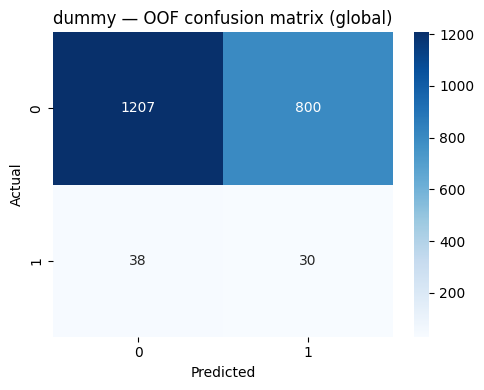


=== Confusion matrix (OOF, global) — logistic ===


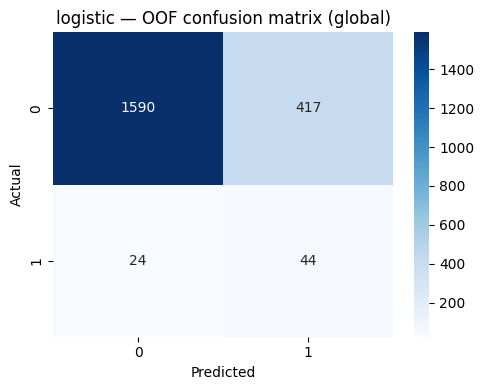


=== Confusion matrix (OOF, global) — random_forest ===


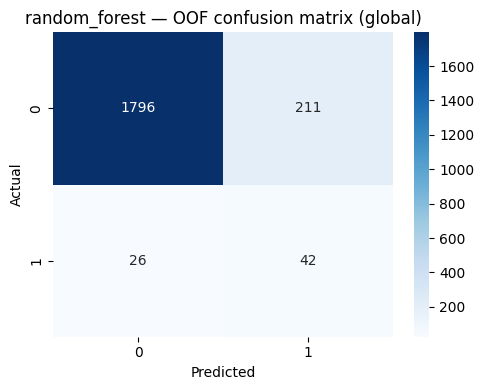


=== Confusion matrix (OOF, global) — xgboost ===


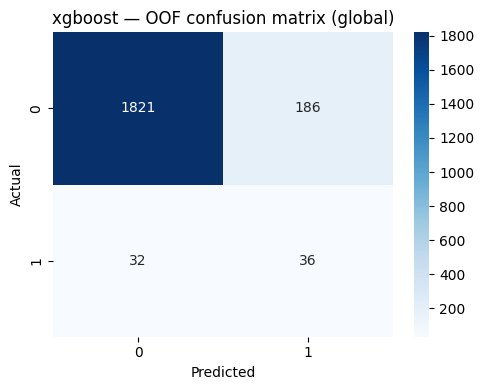

[LightGBM] [Info] Number of positive: 24, number of negative: 392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000497 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4676
[LightGBM] [Info] Number of data points in the train set: 416, number of used features: 34
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.057692 -> initscore=-2.793208
[LightGBM] [Info] Start training from score -2.793208
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

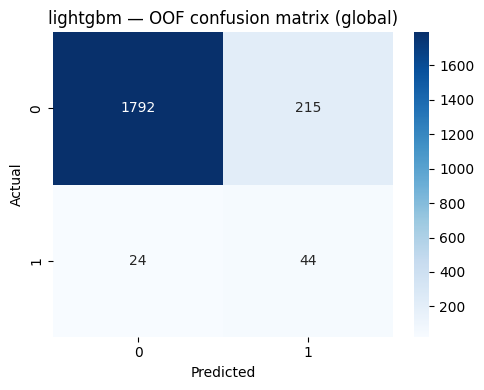


=== Confusion matrix (OOF, global) — catboost ===


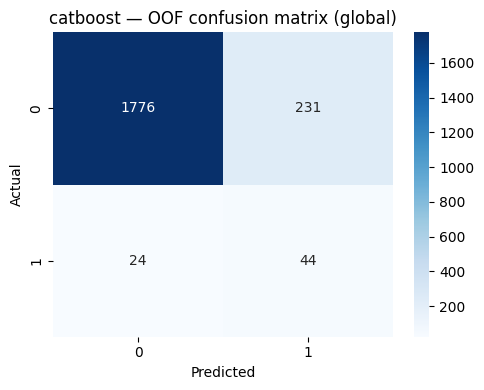

,precision,recall,f1,TP,FP,FN,TN,pr_auc
catboost,0.160000,0.647059,0.256560,44.000000,231.000000,24.000000,1776.000000,0.151498
lightgbm,0.169884,0.647059,0.269113,44.000000,215.000000,24.000000,1792.000000,0.140805
random_forest,0.166008,0.617647,0.261682,42.000000,211.000000,26.000000,1796.000000,0.139891
xgboost,0.162162,0.529412,0.248276,36.000000,186.000000,32.000000,1821.000000,0.136986
logistic,0.095445,0.647059,0.166352,44.000000,417.000000,24.000000,1590.000000,0.083012
dummy,0.036145,0.441176,0.066815,30.000000,800.000000,38.000000,1207.000000,0.035380
mean,0.131607,0.588235,0.211466,40.000000,343.333333,28.000000,1663.666667,0.114596
std,0.049681,0.077816,0.073249,5.291503,218.069306,5.291503,218.069306,0.041758


In [7]:
results = run_benchmark_pipeline(df, verbose=False, plot_confusion=True)

results_df = pd.DataFrame(results).T
results_df = results_df.sort_values("pr_auc", ascending=False)

# Summary rows
results_df.loc["mean"] = results_df.select_dtypes("number").mean()
results_df.loc["std"]  = results_df.select_dtypes("number").std()

results_df